<a href="https://colab.research.google.com/github/riyasoni17/Engineers-Day-2025/blob/main/Riya_Soni_SelectionTask.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas matplotlib rasterio geemap leafmap

In [2]:
import os
import glob
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
import geemap
import leafmap
import warnings

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
DRIVE_BASE_PATH = '/content/drive/My Drive/'

In [5]:
PROVIDED_DATA_PATH = os.path.join(DRIVE_BASE_PATH, 'Riya_Soni_SelectionTask/Provided_Data/')

In [8]:
NCR_SHAPEFILE_PATH = os.path.join(PROVIDED_DATA_PATH, 'delhi_ncr_region.geojson') # NCR Shapefile
AIRSHED_SHAPEFILE_PATH = os.path.join(PROVIDED_DATA_PATH, 'delhi_airshed.geojson') # Airshed Shapefile
TILES_FOLDER_PATH = os.path.join(DRIVE_BASE_PATH, 'GEE_Delhi_Airshed_Tiles/') # Path to the downloaded dataset- 4,608 GEE tiles
LAND_COVER_PATH = os.path.join(PROVIDED_DATA_PATH, 'worldcover_bbox_delhi_ncr_2021.tif') # Land Cover TIF (Q2)

**Q1. Spatial Reasoning & Data Download [5 Marks]**

1.   Plot the Delhi-NCR shapefile using matplotlib (0.25).
2.   Overlay this grid (Delhi Airshed) on a satellite basemap using geemap or leafmap (1.0 mark).
3. Your task is to download only the Delhi airshed imagery from Sentinel-2 (Surface Reflectance preferred, timestamp: January 2025 - RGB). Each downloaded tile should be 1280 m × 1280 m, and the file name should correspond to the tile’s center coordinates. Use Google Earth Engine for downloading. The final deliverable will be a folder link containing sample downloaded images. (2.25)



1.   To confirm successful download of all tiles, you must provide visual plots and the total count of downloaded images.(0.50)
2.   Sentinel 2 is not cloud preproprocess you have to take less cloud imagery of the month. (0.25)
6. When downloading satellite imagery, what important parameters should you consider and why?


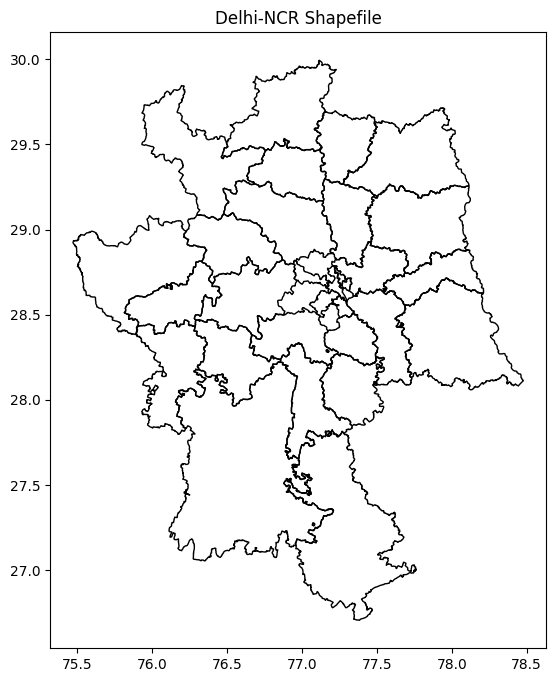

In [12]:
# 1. Plot the Delhi-NCR shapefile using matplotlib (0.25).

delhi_ncr = gpd.read_file(NCR_SHAPEFILE_PATH)
fig, ax = plt.subplots(figsize=(8, 8))
delhi_ncr.plot(ax=ax, edgecolor="black", facecolor="none", linewidth=1)
plt.title("Delhi-NCR Shapefile")
plt.show()

In [14]:
# 2. Overlay this grid (Delhi Airshed) on a satellite basemap using geemap or leafmap (1.0 mark).

# Load airshed grid
airshed = gpd.read_file(AIRSHED_SHAPEFILE_PATH)

# Create map centered on Delhi
m = leafmap.Map(center=[28.6, 77.2], zoom=10)
m.add_basemap("SATELLITE")  # Add a satellite basemap

# Add Delhi-NCR boundary
m.add_gdf(
    delhi_ncr,
    layer_name="Delhi-NCR Region",
    style={"color": "black", "fillColor": "none"},
    zoom_to_layer=False
)

# Add airshed grid
m.add_gdf(
    airshed,
    layer_name="Delhi Airshed Grid",
    style={"color": "red", "fillColor": "none"}
)

m


Map(center=[28.6, 77.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

In [15]:
# 3. Your task is to download only the Delhi airshed imagery from Sentinel-2 (Surface Reflectance preferred, timestamp: January 2025 - RGB).
#    Each downloaded tile should be 1280 m × 1280 m, and the file name should correspond to the tile’s center coordinates.
#    Use Google Earth Engine for downloading. The final deliverable will be a folder link containing sample downloaded images. (2.25)

